# Soil properties and soil profile data

<b>Table of Contents</b>

- Overview
- Setup
    - Get authentication token
- Data layers
    - Data layer dimensions
- Querying the data layers
    - Point query
    - Raster query
- References


## Overview

Soil properties and soil profile data is the Data Set that consists of collections of soil property maps for the world produced using machine learning at 250 m resolution. Predictions are made at six standard depths. SoilGrids uses global models that make use of all available input point data to map a property across the globe. This results in consistent predictions (no abrupt changes in predicted values at country boundaries, etc).

Let us get a practical understanding about this Data Set and its usage through this tutorial.

## Setup

Before starting, you have to install IBM EI Geospatial python SDK i.e ibmpairs and other modules needed to run this sample, mentioned in the cell below.

<b>Note:</b> To run this notebook seamlessly, you have to first configure your Geospatial APIs' credentials in a file named `secrets.ini` in the below format:

```
[EI]
api.api_key = <Your Geospatial APIs API key>
api.tenant_id = <Your Geospatial APIs Tenant ID>
api.org_id = <Your Geospatial APIs Org ID>
```

Keep the secrets.ini file at an appropriate relative location of this notebook. For example, as specified in the config below.

```config.read('../../../../auth/secrets.ini')```

In [ ]:
%pip install ibmpairs
%pip install configparser
%pip install matplotlib
%pip install ipyplot

In [1]:
import ibmpairs.client as client
import ibmpairs.catalog as catalog
import ibmpairs.query as query
import pandas as pd
import configparser
import json
import numpy as np
from PIL import Image as PILImage
from IPython.display import Image, display
import matplotlib.pyplot as plt
import os
import ipyplot


Now, we shall create a client object using the API_KEY, TENANT_ID (or CLIENT_ID) and ORG_ID to create an authenticated HTTP client Authentication token using 'ibmpairs.client' module, to use it in the subsequent steps.

### Get authentication token

In [3]:
config = configparser.RawConfigParser()
config.read('../../../../auth/secrets.ini')
# Best practice is not to include secrets in source code so we read
# an api key, tenant id and org id from a secrets.ini file.
# You could set the credentials in-line here but we don't
# recommend it for security reasons.

EI_API_KEY    = config.get('EI', 'api.api_key')
EI_TENANT_ID  = config.get('EI', 'api.tenant_id') 
EI_ORG_ID     = config.get('EI', 'api.org_id')  

EI_client_v3  = client.get_client(api_key   = EI_API_KEY,
                                    tenant_id = EI_TENANT_ID,
                                    org_id    = EI_ORG_ID,
                                    legacy    = False,
                                    version   = 3
                                   )

2025-01-22 12:20:23 - paw - INFO - The client authentication method is assumed to be OAuth2.
2025-01-22 12:20:23 - paw - INFO - Legacy Environment is False
2025-01-22 12:20:23 - paw - INFO - The authentication api key type is assumed to be IBM EIS, because the api key prefix 'PHX' is present.
2025-01-22 12:20:25 - paw - INFO - Authentication success.
2025-01-22 12:20:25 - paw - INFO - HOST: https://api.ibm.com/geospatial/run/na/core/v3


## Data layers

We would start by querying the ibmpairs catalog to retrieve the Data Set ID and the Data Layers that form the Data Set.


In [4]:
pd.set_option('display.max_colwidth', None)
search_df=catalog.search("Soil properties and soil profile data")
search_df[['dataset_id','data_layer_id','data_layer_name','data_layer_description_short',
           'data_layer_level','data_layer_type','data_layer_unit','data_set_name','data_set_description_short']]

,dataset_id,data_layer_id,data_layer_name,data_layer_description_short,data_layer_level,data_layer_type,data_layer_unit,data_set_name,data_set_description_short
0,62,50492,Bulk density,Bulk density (g/cm3) of the fine earth fraction (<2mm).,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
1,62,50493,Sand,Proportion of sand particles (> 0.05 mm) in the fine earth fraction.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
2,62,50494,Clay,Proportion of clay particles (< 0.002 mm) in the fine earth fraction.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
3,62,50495,Silt,Proportion of silt particles (greater than or equal to 0.002 mm and less than or equal to 0.05 mm) in the fine earth fraction.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
4,62,50496,pH,Soil pH (in water).,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
5,62,50497,Soil organic carbon,Soil organic carbon content in the fine earth fraction.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
6,62,50498,Organic carbon density,Organic carbon density.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
7,62,50506,Organic carbon stocks,Organic carbon stocks (0-30cm depth),18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
8,62,50507,Cation exchange capacity,Cation exchange capacity of the soil.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
9,62,50508,Coarse fragments,Volumetric fraction of coarse fragments (> 2 mm).,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.


As seen above, this Data Set of soil properties and soil profile data with ID 62 has thirteen Data Layers. These Data Layers is a collections of various soil properties that includes the soil profile information from 0 to 200cm soil depth. 

Each of the Data Layers are identified by a unique Data Layer ID. To gain a better understanding of the Data Set and its geospatial and temporal coverage as well as other relevant metadata, we can make further queries to the ibmpairs catalog submodule as mentioned in the [tutorials](https://ibm.github.io/ibmpairs/tutorials/quickstart/quickstartcatalog.html).

### Data layer dimensions
Each of the Data Layer of the Soilgrids Data Set has Dimensions. A Data Layer Dimension gives context to the value recorded for the Data Layer. The Soilgrids Data Layer is reported for 6 standard depth intervals of 0-5 cm, 5-15 cm, 15-30 cm, 30-60 cm, 60-100 cm and 100-200 cm as `depth` Dimension. For each Soilgrids Data Layer and each standard depth interval probability distribution is characterised by `quantile` Dimension of q05 - 5% quantile; q50 - median of the distribution; mean - mean of the distribution; q95 - 95% quantile. There are no Dimensions for Data Layer `Soil classification most probable class`. And the Dimension for Data Layer `Soil class probability` is `rsg`. This Dimension represents Reference Soil Groups (RSG), there are 30 different RSGs available. 

For more understanding of the Soil properties and soil profile data Data Layer Dimensions, we can make further queries to the ibmpairs catalog submodule as mentioned in the [tutorials](https://ibm.github.io/ibmpairs/tutorials/quickstart/quickstartcatalog.html).

Refer the table below for soil properties and soil profile data Data Layers and its Dimensions. 

#### List of the data layer dimensions

<div style="display: inline-block">
    
| Data Layer ID |  Data Layer Name   | Dimensions | Dimensions Values|
|:---------------|:-------------------|:---------   |:-------------- |
| 50492         | Bulk density  |   <b>depth</b>|  0to5cm   | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
|           |                    |                  |   uncertainty    |
| 50493             | Sand       |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50494             | Clay       |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50495             | Silt       |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50496             | pH       |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50497       | Soil organic carbon       |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
|           |                    |                  |   uncertainty    |
| 50498       | Organic carbon density       |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50506       | Organic carbon stocks       |   <b>quantile</b>   |  q05  | 
|           |                    |                  |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50507       | Cation exchange capacity      |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50508      | Coarse fragments     |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50509      | Nitrogen     |   <b>depth</b>   |  0to5cm  | 
|             |                     |               |  5to15cm  | 
|             |                     |               |  15to30cm  | 
|             |                     |               |   30to60cm | 
|             |                     |               | 60to100cm | 
|             |                     |               |  100to200cm |             
|           |                    |  <b>quantile</b> |   q05        |
|           |                    |                      |q50      |
|           |                    |                  |    q95     |
|           |                    |                  |  mean |
| 50510      | Soil class probability  |   <b>rsg</b>   |  fluvisols  | 
|             |                     |               |  umbrisols | 
|             |                     |               |  chernozems  | 
|             |                     |               |   gleysols | 
|             |                     |               | andosols| 
|             |                     |               |  phaeozems |             
|           |                    |                      |solonchaks      |
|           |                    |                  |    alisols   |
|           |                    |                  |  leptosols |
|             |                     |               |  nitisols | 
|             |                     |               |  ferralsols  | 
|             |                     |               |   albeluvisols | 
|             |                     |               | regosols| 
|             |                     |               |  planosols |             
|           |                    |                      |plinthosols      |
|           |                    |                  |    durisols   |
|           |                    |                  |  gypsisols |
|           |                    |                      |stagnosols      |
|           |                    |                  |    calcisols   |
|           |                    |                  |  kastanozems |
|             |                     |               |  histosols | 
|             |                     |               |   podzols | 
|             |                     |               | cambisols| 
|             |                     |               |  arenosols |             
|           |                    |                      |luvisols      |
|           |                    |                  |    vertisols   |
|           |                    |                  |  lixisols |
|             |                     |               |  cryosols |             
|           |                    |                      |solonetz      |
|           |                    |                  |    acrisols   |
| 50511      | Soil classification most probable class    |  NA   |  NA  | 

</div>


## Querying the data layers
### Point query

Next, let us make a point query for locations to observe soil information value and gauge the soil features of that location. We can give a list of the Data Layers for this Data Set of soil properties and soil profile data in form of Data Layer Id, the point coordinates of the location, temporal period and the respective Data Layer Dimension value to explore the soil information. 

In [5]:
query_result = query.submit(
    {
        "layers": [
            {
                "type": "raster",
                "id": "50492",
                "dimensions": [{"name": "depth","value": "30to60cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50493",
                "dimensions": [{"name": "depth","value": "5to15cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50494",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50495",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "q95"}]
            },
            {
                "type": "raster",
                "id": "50496",
                "dimensions": [{"name": "depth","value": "15to30cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50497",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50498",
                "dimensions": [{"name": "depth","value": "100to200cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50506",
                "dimensions": [{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50507",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "q50"}]
            },
            {
                "type": "raster",
                "id": "50508",
                "dimensions": [{"name": "depth","value": "30to60cm"},{"name": "quantile","value": "q50"}]
            },
            {
                "type": "raster",
                "id": "50509",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50510",
                "dimensions": [{"name": "rsg","value": "fluvisols"}]
            },
            {
                "type": "raster",
                "id": "50511"
            }
        ],
        "spatial" : {
            "type" : "point",
            "coordinates": [
                19.4139, -70.3168, 
                13.8753, -60.9865, 
                25.17633, -76.20396,
                49.544192377, 9.673552705]
        },
        "temporal": {
            "intervals": [
                {
                    "start": "2019-12-05T00:00:00Z",
                    "end": "2019-12-05T10:00:00Z"
                }
            ]
        }
    }, client=EI_client_v3)
# Convert the results to a dataframe
point_df = query_result.point_data_as_dataframe()
point_df['value'] = point_df['value'].apply(lambda x: '{:.6f}'.format(float(x)))
point_df['datetime'] = pd.to_datetime(point_df['timestamp'] , unit='ms', errors = 'coerce')
point_df['datetime'] = point_df['datetime'].dt.strftime('%Y-%m-%dT%H:%M:%SZ')
point_df = point_df.drop(columns=['timestamp'])
point_df

2025-01-22 12:20:53 - paw - INFO - TASK: submit STARTING.
2025-01-22 12:21:23 - paw - INFO - TASK: submit COMPLETED.


,layer_id,layer_name,dataset,longitude,latitude,value,property,datetime
0,50492,Bulk density,Soil properties and soil profile data,-60.986500,13.875300,0.720000,depth:30to60cm;quantile:q05,2019-12-05T00:00:00Z
1,50492,Bulk density,Soil properties and soil profile data,-70.316800,19.413900,1.000000,depth:30to60cm;quantile:q05,2019-12-05T00:00:00Z
2,50492,Bulk density,Soil properties and soil profile data,-76.203960,25.176330,0.380000,depth:30to60cm;quantile:q05,2019-12-05T00:00:00Z
3,50492,Bulk density,Soil properties and soil profile data,9.673553,49.544192,1.240000,depth:30to60cm;quantile:q05,2019-12-05T00:00:00Z
4,50493,Sand,Soil properties and soil profile data,-60.986500,13.875300,4.100000,depth:5to15cm;quantile:q05,2019-12-05T00:00:00Z
5,50493,Sand,Soil properties and soil profile data,-70.316800,19.413900,3.700000,depth:5to15cm;quantile:q05,2019-12-05T00:00:00Z
6,50493,Sand,Soil properties and soil profile data,-76.203960,25.176330,1.700000,depth:5to15cm;quantile:q05,2019-12-05T00:00:00Z
7,50493,Sand,Soil properties and soil profile data,9.673553,49.544192,1.900000,depth:5to15cm;quantile:q05,2019-12-05T00:00:00Z
8,50494,Clay,Soil properties and soil profile data,-60.986500,13.875300,50.100002,depth:60to100cm;quantile:mean,2019-12-05T00:00:00Z
9,50494,Clay,Soil properties and soil profile data,-70.316800,19.413900,55.600002,depth:60to100cm;quantile:mean,2019-12-05T00:00:00Z


We see above, the soil properties values are obtained for various Data Layers with their respective Dimensions of `depth` and `quantile` for various locations we queried for. For instance, the location we queried for Data Layer `sand` with Data Layer ID as 50493 has a value `1.900000` displayed for a depth of 5to15cm and quantile of q05.

### Raster query

Next, let us make a raster query for the square area to observe the soil information and characteristics of that terrain.


In [6]:
soilgrids_result = query.submit_check_status_and_download(
    {
        "publish": True,
        "name": "Soilgrids Raster Query",
        "spatial": {
            "type": "square",
             "coordinates": [9.417, 49.388, 10.227, 49.914]
        },
        "temporal": {
            "intervals": [
                {
                    "start": "2019-12-05T00:00:00",
                    "end": "2019-12-05T00:00:00"
                }
            ]
        },
        "layers": [
            {
                "type": "raster",
                "id": "50492",
                "dimensions": [{"name": "depth","value": "30to60cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50493",
                "dimensions": [{"name": "depth","value": "5to15cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50494",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50495",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "q95"}]
            },
            {
                "type": "raster",
                "id": "50496",
                "dimensions": [{"name": "depth","value": "15to30cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50497",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50498",
                "dimensions": [{"name": "depth","value": "100to200cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50506",
                "dimensions": [{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50507",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "q50"}]
            },
            {
                "type": "raster",
                "id": "50508",
                "dimensions": [{"name": "depth","value": "30to60cm"},{"name": "quantile","value": "q50"}]
            },
            {
                "type": "raster",
                "id": "50509",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50510",
                "dimensions": [{"name": "rsg","value": "fluvisols"}]
            },
            {
                "type": "raster",
                "id": "50511"
            }
        ]
    }, client=EI_client_v3)

2025-01-22 12:21:51 - paw - INFO - TASK: submit_check_status_and_download STARTING.
2025-01-22 12:21:54 - paw - INFO - The query was successfully submitted with the id: 1737504000_24714000.
2025-01-22 12:21:55 - paw - INFO - The query 1737504000_24714000 has the status Queued.
2025-01-22 12:22:26 - paw - INFO - The query 1737504000_24714000 has the status Running.
2025-01-22 12:22:57 - paw - INFO - The query 1737504000_24714000 has the status Succeeded.
2025-01-22 12:22:57 - paw - INFO - The query 1737504000_24714000 was successful after checking the status.
2025-01-22 12:23:28 - paw - INFO - The query 1737504000_24714000 has the status Succeeded.
2025-01-22 12:23:28 - paw - INFO - The query 1737504000_24714000 was successful after checking the status.
2025-01-22 12:23:28 - paw - WARNING - The query download folder download was not present on the operating system as either a fixed or relative path. Attempting to create.
2025-01-22 12:23:28 - paw - INFO - The query download folder is se

The query takes a few seconds to complete and downloads the output as a zip file in the /download folder within the same location as this notebook. Now we shall display the resultant tiffs using the following utility function.


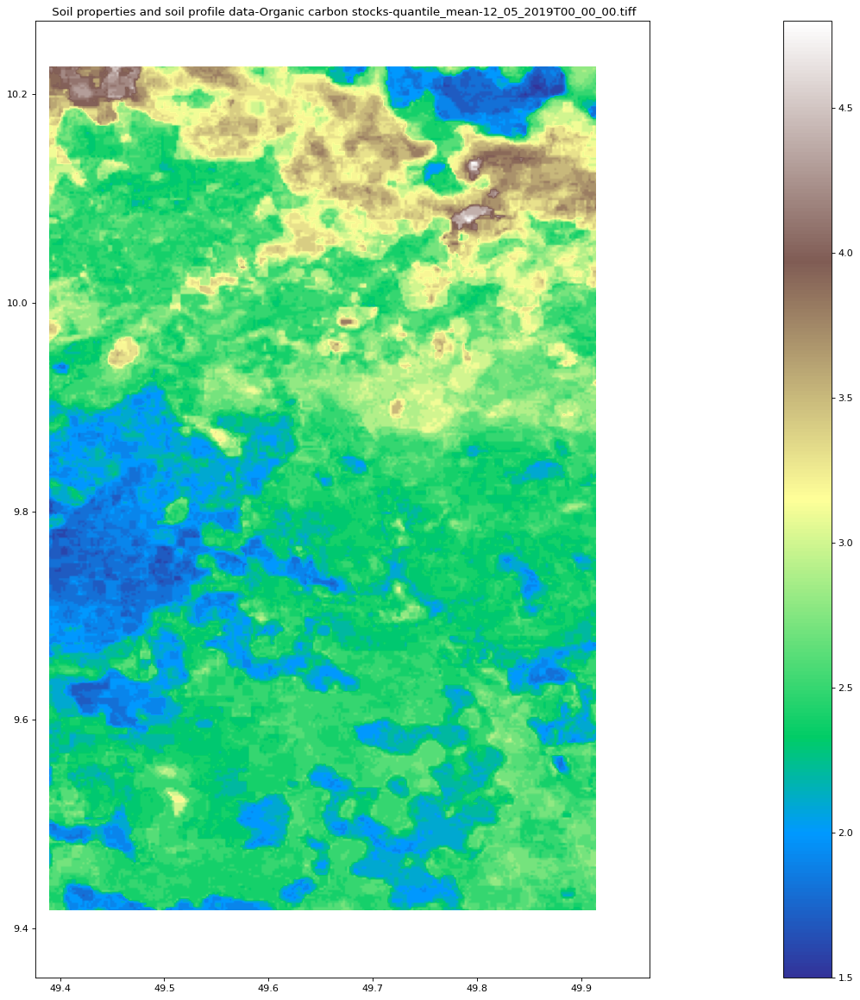

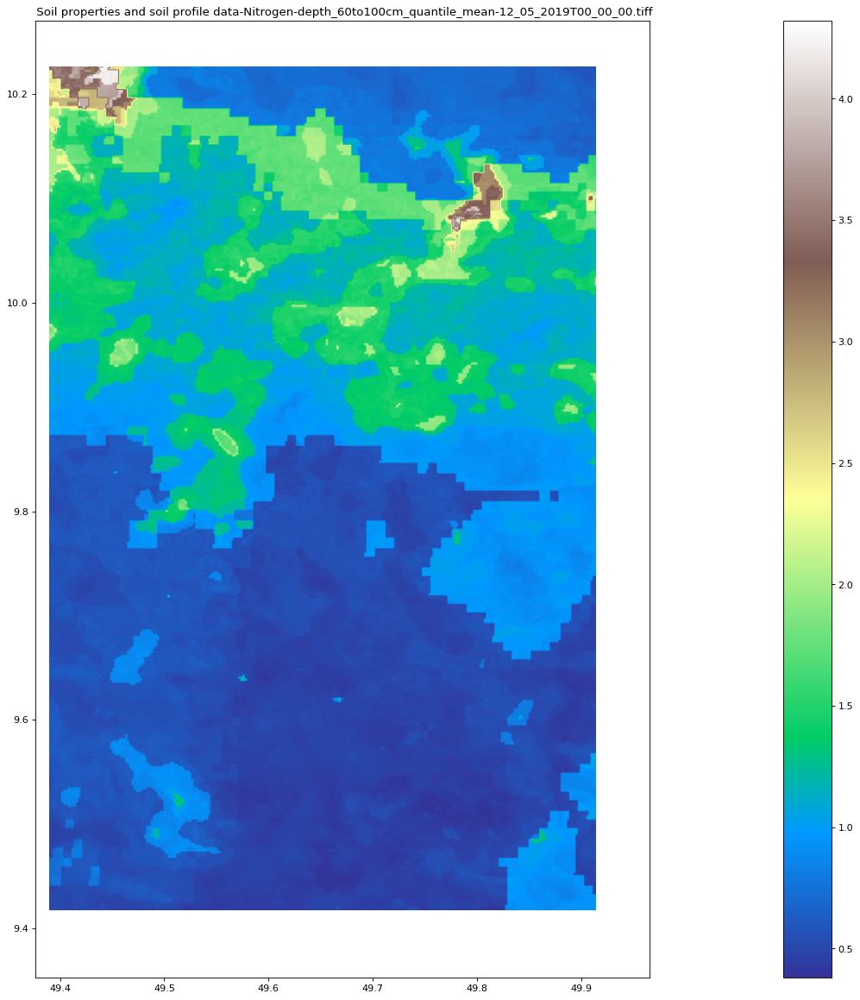

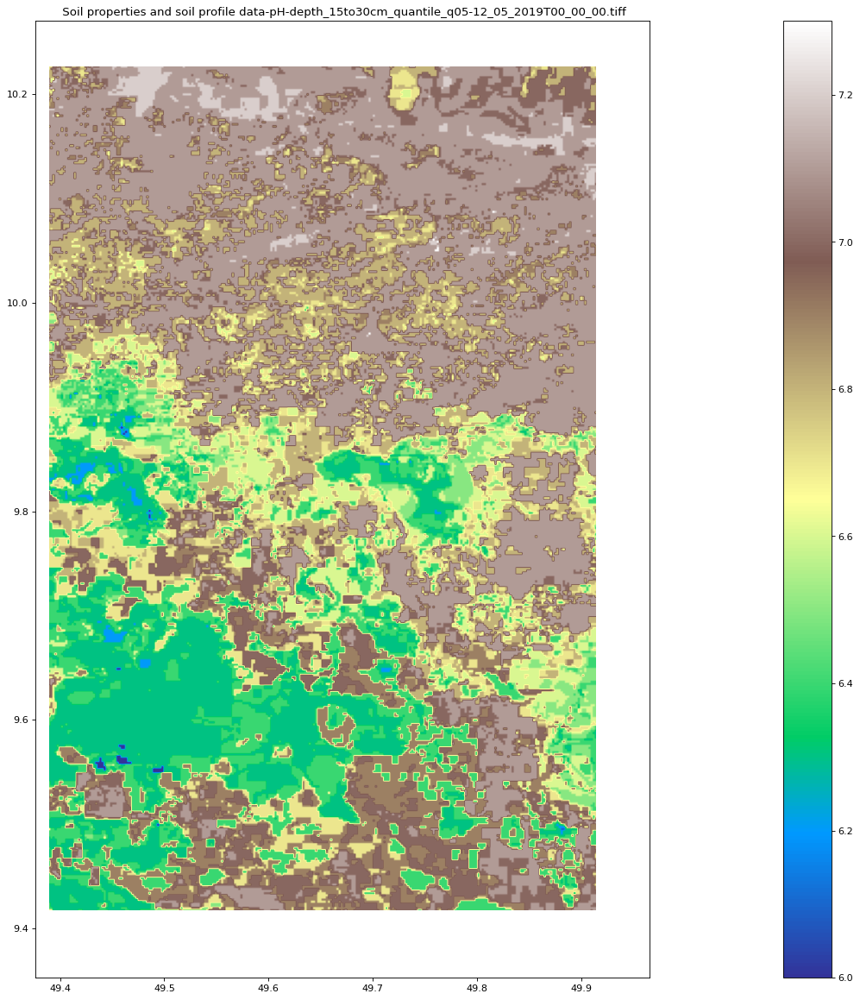

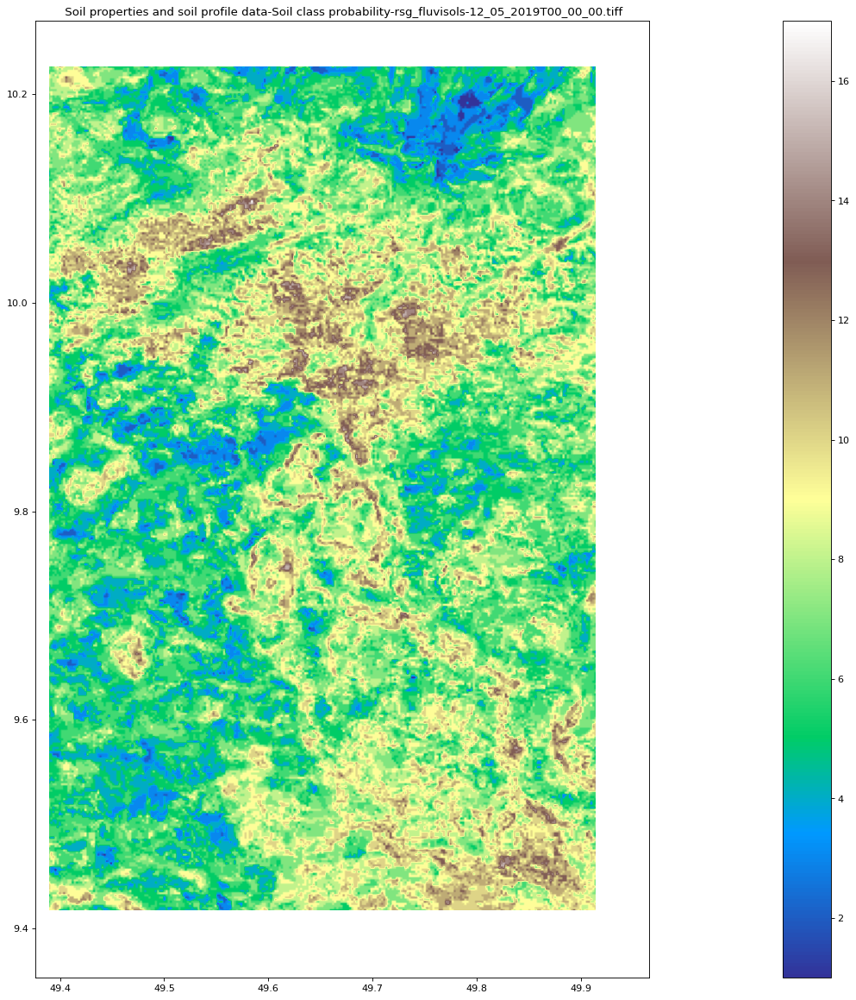

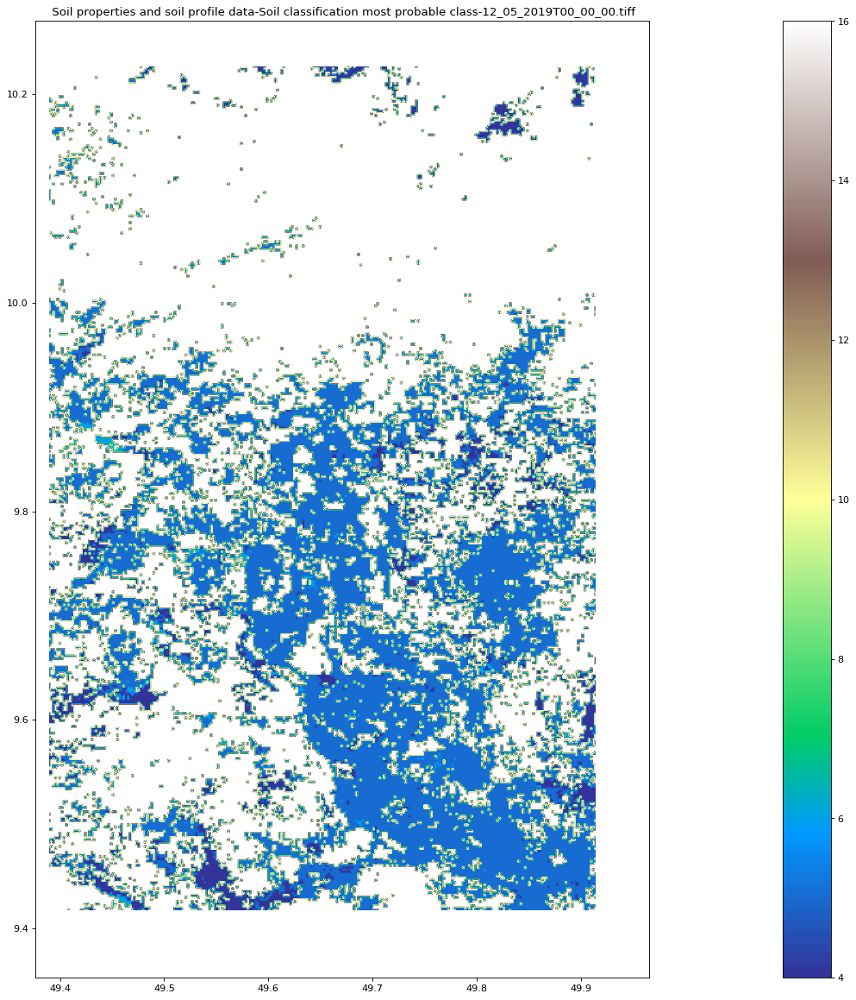

...

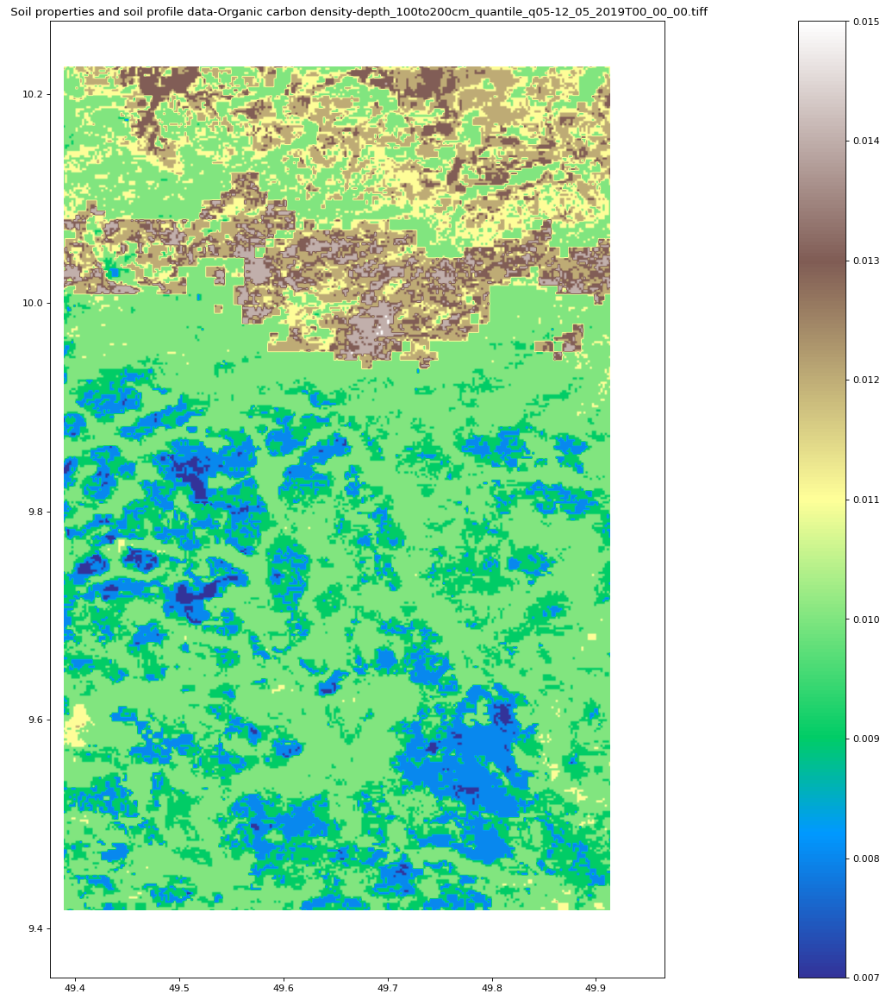

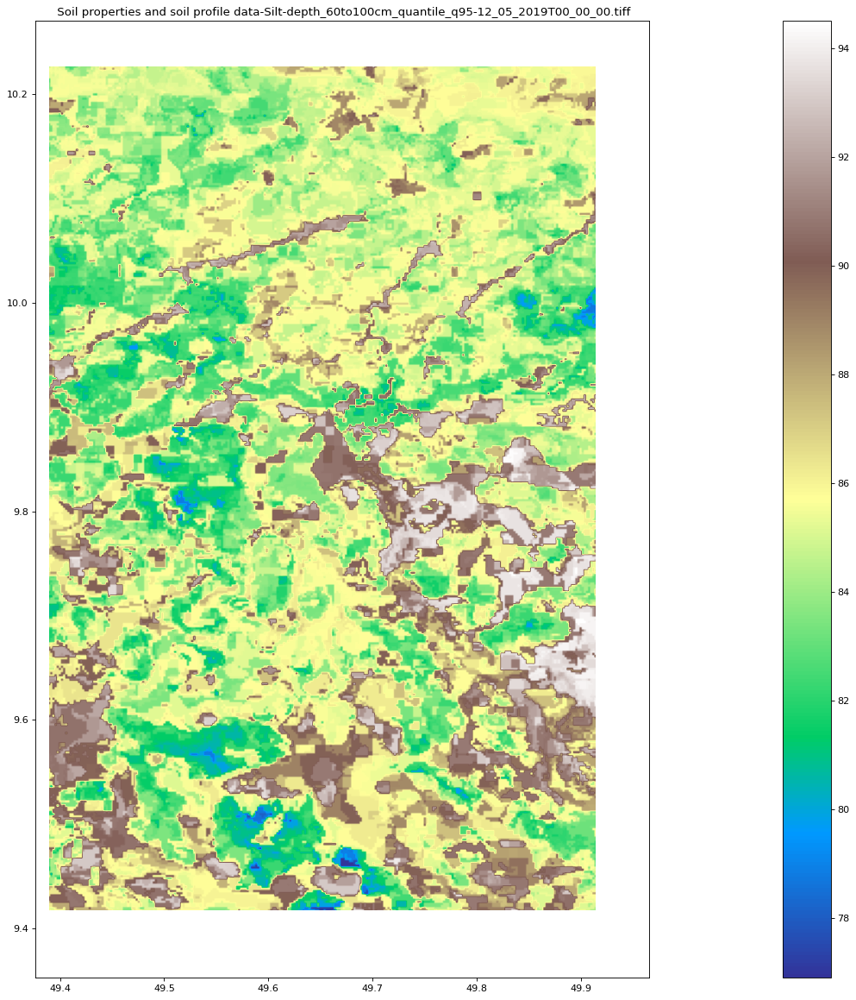

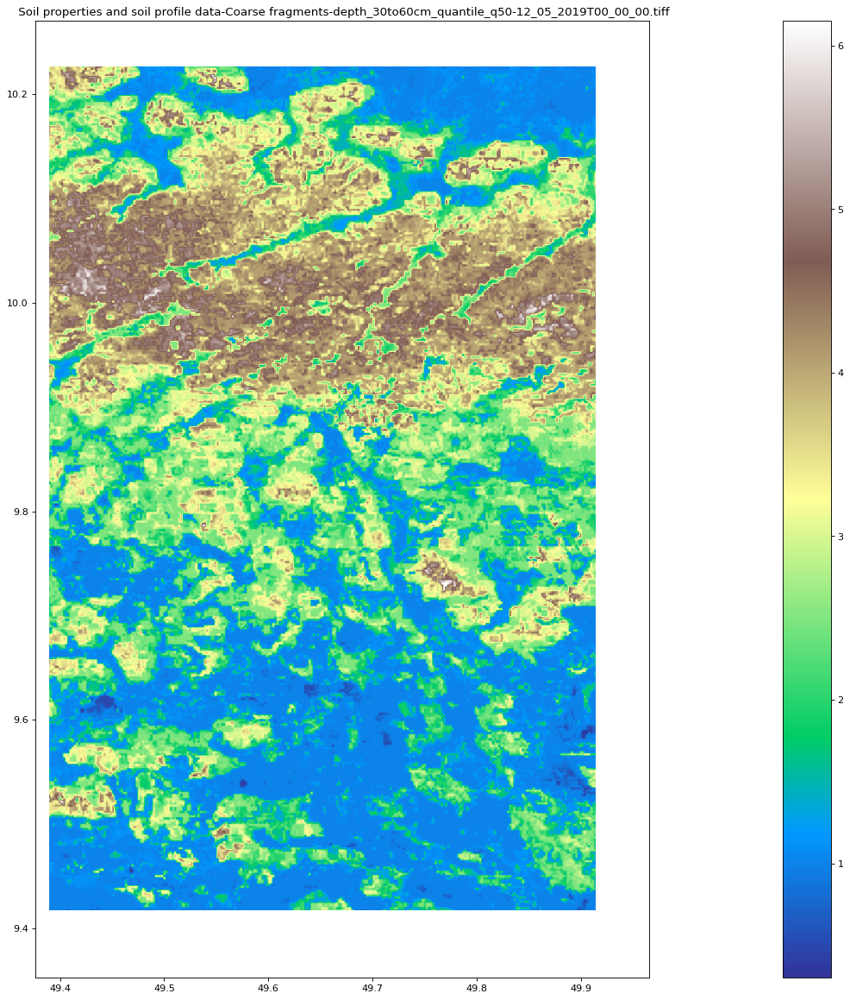

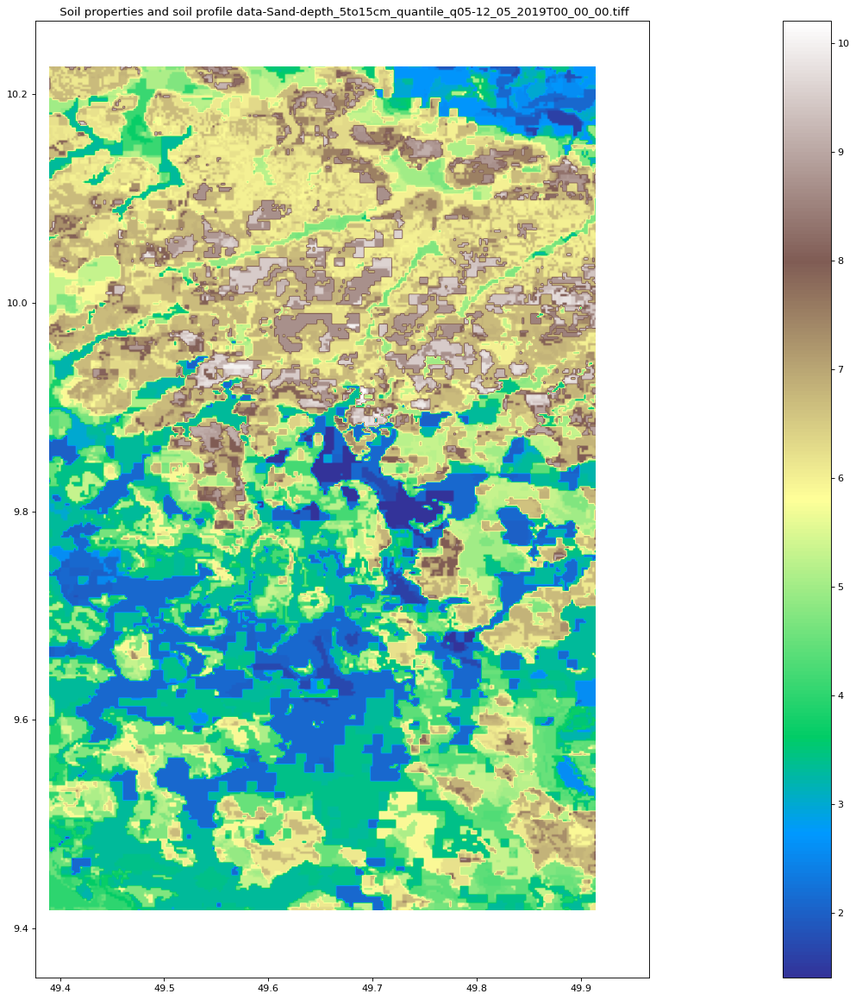

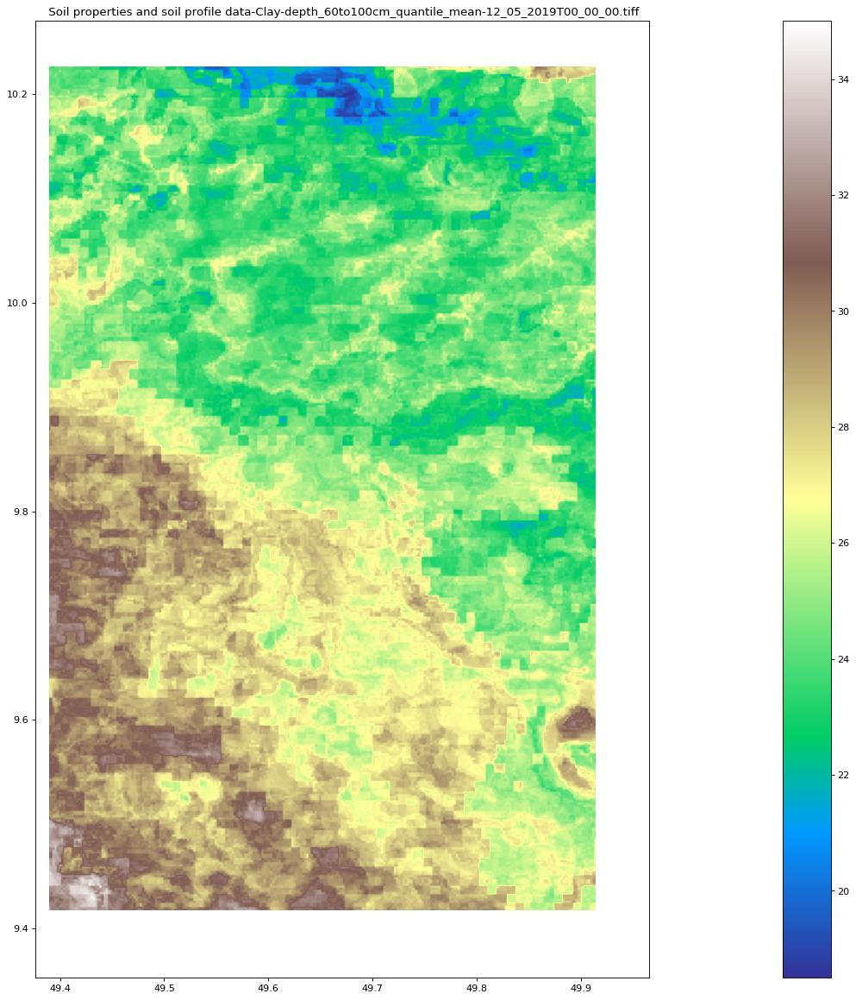

In [7]:
# Function to display the resulting Tiff(s).
soilgrids_file_list = soilgrids_result.list_files()
output_image_array = []
for file in soilgrids_file_list:
    if file.endswith('.tiff'): #display the raster images
        with open(file+'.json', 'r') as summary_file:
            fileparms = json.load(summary_file)
        boundingBox=fileparms["boundingBox"]
        pixelStatistics=fileparms["rasterStatistics"]
        myextent=[boundingBox["minLongitude"],
                  boundingBox["maxLongitude"],
                  boundingBox["minLatitude"],
                  boundingBox["maxLatitude" ] ]  
        array_soilgrids = np.array(PILImage.open(file))
        mask = (array_soilgrids == -9999)
        # Masked array to exclude NO Data points from plotting
        masked_array = np.ma.masked_array(array_soilgrids, mask)
        plt.figure(figsize = (50, 18), dpi=80) # Sets the size and resolution of the plot
        plt.imshow(masked_array,
                   cmap = 'terrain', 
                   vmin=pixelStatistics["pixelMin"], 
                   vmax=pixelStatistics["pixelMax"],
                   extent = myextent) # Loads the raster data and sets the colormap
        plt.colorbar() # Adds the color bar
        plt.title(" "+os.path.basename(file)) 
        output_image_path = os.path.splitext(os.path.basename(file))[0] + ".png"
        output_image_array.append(output_image_path)
        # Save the figure
        plt.savefig(output_image_path, bbox_inches='tight')
        plt.close() 

    
for output_image in output_image_array:
    #display the raster images
    display(Image(output_image, width=600, height=300))
    

Each of the images above represents the soil properties and information for the specified spatial location and temporal period. The color code scale represents the variation of the values of the soil properties, making it easier to analyse soil information of the terrain for various applications like agriculture and other use cases. 


## References
https://www.isric.org/explore/soilgrids

https://soilgrids.org/

https://www.isric.org/explore/soilgrids/faq-soilgrids